In [1]:
!rm -rf /kaggle/working/*

In [2]:
! pip install grad-cam
! pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.7-py3-none-any.whl size=53345 sha256=f35bca6e898ca6636f9ca33d65ba998a61f1a69d5f6fa9bacd05dd84cd4466fc
  Stored in directory: /root/.cache/pip/wheels/05/bd/e2/0c0eecf3c26b6cdb231b5656d53905bddc8090d69619d57e6b
Successfully built grad-cam
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 11.7 MB/s eta 0:00:0000:01


In [3]:
import os
import random
import time
import copy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator
from tabulate import tabulate

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import datasets, transforms, models

from torchinfo import summary
from tqdm.auto import tqdm

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    cohen_kappa_score, matthews_corrcoef, roc_auc_score,
    confusion_matrix, classification_report,
    roc_curve, auc, precision_recall_curve, average_precision_score
)
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from sklearn.calibration import calibration_curve

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from captum.attr import IntegratedGradients, Occlusion

import gradio as gr

%matplotlib inline

In [4]:
def set_all_seeds(seed=42):
    """
    Forces all random number generators to use a fixed seed, enabling
    fully reproducible experiments across CPU and GPU.
    """
    # 1. Set environment variables
    os.environ['PYTHONHASHSEED'] = str(seed)
    
    # Required for PyTorch deterministic algorithms (CUDA >= 10.2)
    os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8' 
    
    # 2. Set Python built-in random generator
    random.seed(seed)
    
    # 3. Set NumPy random generator
    np.random.seed(seed)
    
    # 4. Set PyTorch random generators
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed) # For multi-GPU environments
    
    # 5. Configure CuDNN backend for determinism
    # deterministic=True ensures reproducible convolution algorithms
    torch.backends.cudnn.deterministic = True 
    # benchmark=False disables the auto-tuner that selects the fastest conv algorithm (which can vary)
    torch.backends.cudnn.benchmark = False
    
    # 6. Force PyTorch to use deterministic algorithms where available
    torch.use_deterministic_algorithms(True, warn_only=True)
    
    print(f"Random seed set to {seed} across all environments.")

# Execute the function
SEED = 42
set_all_seeds(SEED)

Random seed set to 42 across all environments.


In [5]:
# Setup Hyperparameters and Device Configuration
DATA_DIR = '/kaggle/input/datasets/unclesamulus/blood-cells-image-dataset/bloodcells_dataset' # Ensure this matches your extracted dataset folder name
BATCH_SIZE = 32
EPOCHS = 10
LEARNING_RATE = 0.001
WEIGHT_DECAY = 1e-4

# Automatically use GPU if available
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using compute device: {DEVICE}")

Using compute device: cuda


In [6]:
# 1. Define separate pipelines for Training vs. Validation/Testing
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5), # Augmentation: flip left-right
    transforms.RandomVerticalFlip(p=0.5),   # Augmentation: flip up-down
    transforms.RandomRotation(20),          # Augmentation: rotate up to 20 degrees
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    # Notice: NO random flips or rotations here!
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 2. Load the base dataset WITHOUT transforms (loads raw PIL images)
full_dataset = datasets.ImageFolder(root=DATA_DIR)
classes = full_dataset.classes
print(f"Detected {len(classes)} classes: {classes}")

# 3. Calculate exact sizes for 80% Train, 10% Validation, 10% Test
total_size = len(full_dataset)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)
test_size = total_size - train_size - val_size 

# 4. Split the raw dataset
train_subset, val_subset, test_subset = random_split(
    full_dataset, [train_size, val_size, test_size]
)

# 5. Create a professional wrapper to apply specific transforms to subsets
class TransformWrapper(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
        
    def __getitem__(self, index):
        image, label = self.subset[index]
        if self.transform:
            image = self.transform(image)
        return image, label
        
    def __len__(self):
        return len(self.subset)

# Apply the correct transforms to the correct splits
train_dataset = TransformWrapper(train_subset, transform=train_transforms)
val_dataset = TransformWrapper(val_subset, transform=val_test_transforms)
test_dataset = TransformWrapper(test_subset, transform=val_test_transforms)

# 6. Create DataLoaders
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(f"Training samples: {len(train_dataset)} | Validation samples: {len(val_dataset)} | Testing samples: {len(test_dataset)}")

Detected 8 classes: ['basophil', 'eosinophil', 'erythroblast', 'ig', 'lymphocyte', 'monocyte', 'neutrophil', 'platelet']
Training samples: 13673 | Validation samples: 1709 | Testing samples: 1710


In [7]:
# Fetch a single batch from the train_loader using iter() and next()
images, labels = next(iter(train_loader))

print("=== IMAGES TENSOR ===")
# Expected shape: [32, 3, 224, 224] (Batch Size, Color Channels, Height, Width)
print(f"Shape:       {images.shape}") 
print(f"Data Type:   {images.dtype}")
# Because of normalization, values should be roughly between -2.5 and +2.5, not 0 to 1
print(f"Value Range: Min {images.min():.4f} | Max {images.max():.4f}")

print("\n=== LABELS TENSOR ===")
# Expected shape: [32] (One integer per image in the batch)
print(f"Shape:       {labels.shape}")
print(f"Data Type:   {labels.dtype}")
print(f"First 10:    {labels[:10].tolist()}")

=== IMAGES TENSOR ===
Shape:       torch.Size([32, 3, 224, 224])
Data Type:   torch.float32
Value Range: Min -2.1179 | Max 2.2489

=== LABELS TENSOR ===
Shape:       torch.Size([32])
Data Type:   torch.int64
First 10:    [2, 6, 6, 5, 6, 0, 3, 2, 3, 4]


In [8]:
class BloodCellCNN(nn.Module):
    def __init__(self, num_classes):
        super(BloodCellCNN, self).__init__()
        
        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2)
            )

        self.features = nn.Sequential(
            conv_block(3, 32),    
            conv_block(32, 64),   
            conv_block(64, 128),  
            conv_block(128, 256), 
            conv_block(256, 512)  
        )
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.5), 
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.3),
            nn.Linear(128, num_classes)
        )

        self._initialize_weights()

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)


# Dynamically calculate the exact number of class folders
dynamic_class_names = [d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))]
dynamic_num_classes = len(dynamic_class_names)

# Instantiate the model dynamically and push to GPU/CPU
model = BloodCellCNN(num_classes=dynamic_num_classes).to(DEVICE)

# Output the summary cleanly in Jupyter
summary(
    model,
    input_size=(32, 3, 224, 224), 
    col_names=[
        "input_size",
        "output_size",
        "num_params",
        "kernel_size",
        "mult_adds",
        "trainable"
    ],
    col_width=18,
    row_settings=["var_names"],
    verbose=0 
)

Layer (type (var_name))                  Input Shape        Output Shape       Param #            Kernel Shape       Mult-Adds          Trainable
BloodCellCNN (BloodCellCNN)              [32, 3, 224, 224]  [32, 8]            --                 --                 --                 True
├─Sequential (features)                  [32, 3, 224, 224]  [32, 512, 7, 7]    --                 --                 --                 True
│    └─Sequential (0)                    [32, 3, 224, 224]  [32, 32, 112, 112] --                 --                 --                 True
│    │    └─Conv2d (0)                   [32, 3, 224, 224]  [32, 32, 224, 224] 864                [3, 3]             1,387,266,048      True
│    │    └─BatchNorm2d (1)              [32, 32, 224, 224] [32, 32, 224, 224] 64                 --                 2,048              True
│    │    └─ReLU (2)                     [32, 32, 224, 224] [32, 32, 224, 224] --                 --                 --                 --
│    │    

In [9]:
# Loss function
criterion = nn.CrossEntropyLoss()

# AdamW optimizer with L2 weight decay
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# Learning rate scheduler: Reduces LR when validation loss plateaus
scheduler = lr_scheduler.ReduceLROnPlateau(
    optimizer, 
    mode='min', 
    factor=0.5, 
    patience=2)

In [10]:
# ==========================================
# TRAINING CONFIGURATION
# ==========================================
NUM_EPOCHS = 50
EARLY_STOP_PATIENCE = 5  

best_val_loss = float('inf')
epochs_no_improve = 0
best_model_weights = copy.deepcopy(model.state_dict())
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

# ==========================================
# MAIN TRAINING LOOP
# ==========================================
for epoch in range(1, NUM_EPOCHS + 1):
    start_time = time.time()
    
    # ---------------------------------------
    # 1. TRAINING PHASE
    # ---------------------------------------
    model.train()
    running_train_loss, train_correct, train_total = 0.0, 0, 0
    
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{NUM_EPOCHS} [Train]", leave=False)
    
    for images, labels in train_bar:
        images, labels = images.to(DEVICE), labels.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += torch.sum(preds == labels.data).item()
        train_total += labels.size(0)
        
        train_bar.set_postfix({'loss': f"{loss.item():.4f}"})

    epoch_train_loss = running_train_loss / train_total
    epoch_train_acc = train_correct / train_total

    # ---------------------------------------
    # 2. VALIDATION PHASE
    # ---------------------------------------
    model.eval()
    running_val_loss, val_correct, val_total = 0.0, 0, 0
    
    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{NUM_EPOCHS} [Val]", leave=False)
    
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += torch.sum(preds == labels.data).item()
            val_total += labels.size(0)

    epoch_val_loss = running_val_loss / val_total
    epoch_val_acc = val_correct / val_total

    # ---------------------------------------
    # 3. SCHEDULER & CHECKPOINTING
    # ---------------------------------------
    scheduler.step(epoch_val_loss)

    history['train_loss'].append(epoch_train_loss)
    history['train_acc'].append(epoch_train_acc)
    history['val_loss'].append(epoch_val_loss)
    history['val_acc'].append(epoch_val_acc)
    
    epoch_time = time.time() - start_time
    status = ""

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        best_model_weights = copy.deepcopy(model.state_dict())
        torch.save(model.state_dict(), 'best_blood_cell_model.pth')
        epochs_no_improve = 0
        status = "Saved Best"
    else:
        epochs_no_improve += 1
        status = "No Improve"

    # ---------------------------------------
    # 4. TABULAR OUTPUT (USING TABULATE)
    # ---------------------------------------
    current_lr = optimizer.param_groups[0]['lr']
    
    # Prepare data for tabulate
    table_data = [
        ["Epoch", f"{epoch}"],
        ["Train Loss", f"{epoch_train_loss:.4f}"],
        ["Train Acc", f"{epoch_train_acc*100:.2f}%"],
        ["Val Loss", f"{epoch_val_loss:.4f}"],
        ["Val Acc", f"{epoch_val_acc*100:.2f}%"],
        ["Learning Rate", f"{current_lr:.2e}"],
        ["Epoch Time", f"{epoch_time:.2f}s"],
        ["Patience", f"{epochs_no_improve}/{EARLY_STOP_PATIENCE}"],
        ["Status", status]
    ]
    
    print(f"\nEpoch {epoch}/{NUM_EPOCHS}")
    # tablefmt="grid" provides the exact style seen in your image
    print(tabulate(table_data, headers=["Metric", "Value"], tablefmt="rounded_grid"))
    print("\n")

    if epochs_no_improve >= EARLY_STOP_PATIENCE:
        print("Early stopping triggered!")
        break

# ==========================================
# POST-TRAINING CLEANUP
# ==========================================
print("Training Complete.")
model.load_state_dict(best_model_weights)

Epoch 1/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 1/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 1/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 1          │
├───────────────┼────────────┤
│ Train Loss    │ 0.8316     │
├───────────────┼────────────┤
│ Train Acc     │ 68.66%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.5651     │
├───────────────┼────────────┤
│ Val Acc       │ 81.22%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 137.58s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 2/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 2/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 2/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 2          │
├───────────────┼────────────┤
│ Train Loss    │ 0.4207     │
├───────────────┼────────────┤
│ Train Acc     │ 85.50%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.4235     │
├───────────────┼────────────┤
│ Val Acc       │ 85.31%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.10s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 3/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 3/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 3/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 3          │
├───────────────┼────────────┤
│ Train Loss    │ 0.3058     │
├───────────────┼────────────┤
│ Train Acc     │ 89.74%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.4498     │
├───────────────┼────────────┤
│ Val Acc       │ 83.56%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 99.48s     │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 4/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 4/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 4/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 4          │
├───────────────┼────────────┤
│ Train Loss    │ 0.2492     │
├───────────────┼────────────┤
│ Train Acc     │ 91.84%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.3150     │
├───────────────┼────────────┤
│ Val Acc       │ 89.94%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.17s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 5/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 5/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 5/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 5          │
├───────────────┼────────────┤
│ Train Loss    │ 0.2092     │
├───────────────┼────────────┤
│ Train Acc     │ 93.14%     │
├───────────────┼────────────┤
│ Val Loss      │ 2.1244     │
├───────────────┼────────────┤
│ Val Acc       │ 62.96%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.97s    │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 6/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 6/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 6/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 6          │
├───────────────┼────────────┤
│ Train Loss    │ 0.1955     │
├───────────────┼────────────┤
│ Train Acc     │ 93.45%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1780     │
├───────────────┼────────────┤
│ Val Acc       │ 94.32%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 103.70s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 7/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 7/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 7/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 7          │
├───────────────┼────────────┤
│ Train Loss    │ 0.1792     │
├───────────────┼────────────┤
│ Train Acc     │ 94.19%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.2641     │
├───────────────┼────────────┤
│ Val Acc       │ 91.63%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 103.10s    │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 8/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 8/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 8/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 8          │
├───────────────┼────────────┤
│ Train Loss    │ 0.1603     │
├───────────────┼────────────┤
│ Train Acc     │ 94.62%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.2516     │
├───────────────┼────────────┤
│ Val Acc       │ 90.87%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.69s    │
├───────────────┼────────────┤
│ Patience      │ 2/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 9/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 9/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 9/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 9          │
├───────────────┼────────────┤
│ Train Loss    │ 0.1642     │
├───────────────┼────────────┤
│ Train Acc     │ 94.69%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1270     │
├───────────────┼────────────┤
│ Val Acc       │ 95.79%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.08s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 10/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 10/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 10/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 10         │
├───────────────┼────────────┤
│ Train Loss    │ 0.1487     │
├───────────────┼────────────┤
│ Train Acc     │ 95.16%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1048     │
├───────────────┼────────────┤
│ Val Acc       │ 96.55%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.66s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 11/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 11/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 11/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 11         │
├───────────────┼────────────┤
│ Train Loss    │ 0.1359     │
├───────────────┼────────────┤
│ Train Acc     │ 95.62%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1460     │
├───────────────┼────────────┤
│ Val Acc       │ 94.85%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 99.75s     │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 12/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 12/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 12/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 12         │
├───────────────┼────────────┤
│ Train Loss    │ 0.1326     │
├───────────────┼────────────┤
│ Train Acc     │ 95.73%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1235     │
├───────────────┼────────────┤
│ Val Acc       │ 95.67%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.00e-03   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.96s    │
├───────────────┼────────────┤
│ Patience      │ 2/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 13/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 13/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 13/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 13         │
├───────────────┼────────────┤
│ Train Loss    │ 0.1230     │
├───────────────┼────────────┤
│ Train Acc     │ 95.68%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1149     │
├───────────────┼────────────┤
│ Val Acc       │ 95.79%     │
├───────────────┼────────────┤
│ Learning Rate │ 5.00e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 102.13s    │
├───────────────┼────────────┤
│ Patience      │ 3/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 14/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 14/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 14/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 14         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0932     │
├───────────────┼────────────┤
│ Train Acc     │ 96.96%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0660     │
├───────────────┼────────────┤
│ Val Acc       │ 97.54%     │
├───────────────┼────────────┤
│ Learning Rate │ 5.00e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.14s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 15/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 15/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 15/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 15         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0932     │
├───────────────┼────────────┤
│ Train Acc     │ 97.05%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0569     │
├───────────────┼────────────┤
│ Val Acc       │ 98.13%     │
├───────────────┼────────────┤
│ Learning Rate │ 5.00e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.44s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 16/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 16/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 16/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 16         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0896     │
├───────────────┼────────────┤
│ Train Acc     │ 97.02%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0880     │
├───────────────┼────────────┤
│ Val Acc       │ 97.07%     │
├───────────────┼────────────┤
│ Learning Rate │ 5.00e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.00s    │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 17/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 17/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 17/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 17         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0842     │
├───────────────┼────────────┤
│ Train Acc     │ 97.21%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.1000     │
├───────────────┼────────────┤
│ Val Acc       │ 96.78%     │
├───────────────┼────────────┤
│ Learning Rate │ 5.00e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 102.22s    │
├───────────────┼────────────┤
│ Patience      │ 2/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 18/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 18/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 18/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 18         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0821     │
├───────────────┼────────────┤
│ Train Acc     │ 97.33%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0713     │
├───────────────┼────────────┤
│ Val Acc       │ 97.78%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.86s    │
├───────────────┼────────────┤
│ Patience      │ 3/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 19/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 19/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 19/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 19         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0691     │
├───────────────┼────────────┤
│ Train Acc     │ 97.80%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0460     │
├───────────────┼────────────┤
│ Val Acc       │ 98.30%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 102.94s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 20/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 20/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 20/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 20         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0638     │
├───────────────┼────────────┤
│ Train Acc     │ 97.85%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0547     │
├───────────────┼────────────┤
│ Val Acc       │ 98.01%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.02s    │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 21/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 21/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 21/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 21         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0657     │
├───────────────┼────────────┤
│ Train Acc     │ 97.70%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0454     │
├───────────────┼────────────┤
│ Val Acc       │ 98.36%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.79s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 22/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 22/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 22/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 22         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0643     │
├───────────────┼────────────┤
│ Train Acc     │ 97.97%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0432     │
├───────────────┼────────────┤
│ Val Acc       │ 98.48%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.00s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 23/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 23/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 23/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 23         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0582     │
├───────────────┼────────────┤
│ Train Acc     │ 98.09%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0454     │
├───────────────┼────────────┤
│ Val Acc       │ 98.65%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 101.18s    │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 24/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 24/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 24/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 24         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0599     │
├───────────────┼────────────┤
│ Train Acc     │ 98.15%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0641     │
├───────────────┼────────────┤
│ Val Acc       │ 97.48%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.16s    │
├───────────────┼────────────┤
│ Patience      │ 2/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 25/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 25/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 25/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 25         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0625     │
├───────────────┼────────────┤
│ Train Acc     │ 98.03%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0417     │
├───────────────┼────────────┤
│ Val Acc       │ 98.42%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.46s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 26/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 26/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 26/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 26         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0588     │
├───────────────┼────────────┤
│ Train Acc     │ 98.16%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0350     │
├───────────────┼────────────┤
│ Val Acc       │ 98.77%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.08s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 27/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 27/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 27/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 27         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0604     │
├───────────────┼────────────┤
│ Train Acc     │ 98.11%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0344     │
├───────────────┼────────────┤
│ Val Acc       │ 98.77%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.09s    │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 28/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 28/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 28/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 28         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0615     │
├───────────────┼────────────┤
│ Train Acc     │ 98.06%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0315     │
├───────────────┼────────────┤
│ Val Acc       │ 98.77%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 99.83s     │
├───────────────┼────────────┤
│ Patience      │ 0/5        │
├───────────────┼────────────┤
│ Status        │ Saved Best │
╰───────────────┴────────────╯




Epoch 29/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 29/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 29/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 29         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0551     │
├───────────────┼────────────┤
│ Train Acc     │ 98.14%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0421     │
├───────────────┼────────────┤
│ Val Acc       │ 98.71%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 99.38s     │
├───────────────┼────────────┤
│ Patience      │ 1/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 30/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 30/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 30/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 30         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0547     │
├───────────────┼────────────┤
│ Train Acc     │ 98.26%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0388     │
├───────────────┼────────────┤
│ Val Acc       │ 98.36%     │
├───────────────┼────────────┤
│ Learning Rate │ 2.50e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.36s    │
├───────────────┼────────────┤
│ Patience      │ 2/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 31/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 31/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 31/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 31         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0572     │
├───────────────┼────────────┤
│ Train Acc     │ 98.05%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0470     │
├───────────────┼────────────┤
│ Val Acc       │ 98.13%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.25e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.39s    │
├───────────────┼────────────┤
│ Patience      │ 3/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 32/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 32/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 32/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 32         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0493     │
├───────────────┼────────────┤
│ Train Acc     │ 98.36%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0346     │
├───────────────┼────────────┤
│ Val Acc       │ 98.60%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.25e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 100.19s    │
├───────────────┼────────────┤
│ Patience      │ 4/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯




Epoch 33/50 [Train]:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch 33/50 [Val]:   0%|          | 0/54 [00:00<?, ?it/s]


Epoch 33/50
╭───────────────┬────────────╮
│ Metric        │ Value      │
├───────────────┼────────────┤
│ Epoch         │ 33         │
├───────────────┼────────────┤
│ Train Loss    │ 0.0437     │
├───────────────┼────────────┤
│ Train Acc     │ 98.67%     │
├───────────────┼────────────┤
│ Val Loss      │ 0.0326     │
├───────────────┼────────────┤
│ Val Acc       │ 98.71%     │
├───────────────┼────────────┤
│ Learning Rate │ 1.25e-04   │
├───────────────┼────────────┤
│ Epoch Time    │ 99.54s     │
├───────────────┼────────────┤
│ Patience      │ 5/5        │
├───────────────┼────────────┤
│ Status        │ No Improve │
╰───────────────┴────────────╯


Early stopping triggered!
Training Complete.


<All keys matched successfully>

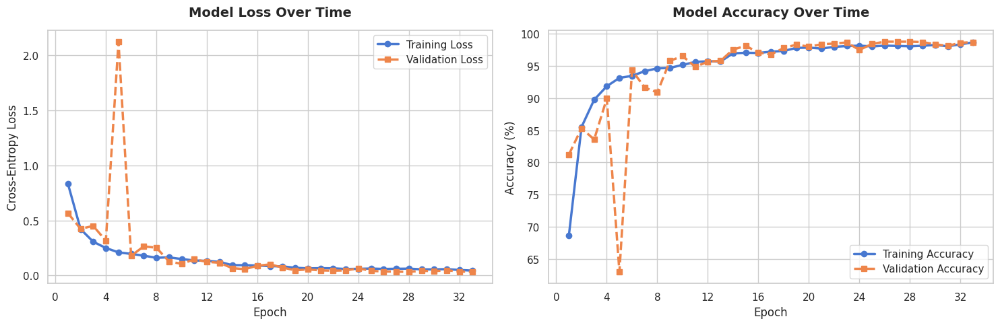

In [11]:
# Apply a clean, professional aesthetic
sns.set_theme(style="whitegrid", palette="muted", context="notebook")

# Extract data from the history dictionary
epochs = range(1, len(history['train_loss']) + 1)
train_loss = history['train_loss']
val_loss = history['val_loss']

# Convert accuracy to percentages for readability
train_acc = [acc * 100 for acc in history['train_acc']]
val_acc = [acc * 100 for acc in history['val_acc']]

# Create a 1x2 figure canvas
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# ==========================================
# 1. LOSS GRAPH
# ==========================================
axes[0].plot(epochs, train_loss, label='Training Loss', marker='o', linewidth=2.5)
axes[0].plot(epochs, val_loss, label='Validation Loss', marker='s', linewidth=2.5, linestyle='--')
axes[0].set_title('Model Loss Over Time', fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Epoch', fontsize=12, fontweight='500')
axes[0].set_ylabel('Cross-Entropy Loss', fontsize=12, fontweight='500')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True)) # Force integer ticks
axes[0].legend(fontsize=11, loc='upper right')

# ==========================================
# 2. ACCURACY GRAPH
# ==========================================
axes[1].plot(epochs, train_acc, label='Training Accuracy', marker='o', linewidth=2.5)
axes[1].plot(epochs, val_acc, label='Validation Accuracy', marker='s', linewidth=2.5, linestyle='--')
axes[1].set_title('Model Accuracy Over Time', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Epoch', fontsize=12, fontweight='500')
axes[1].set_ylabel('Accuracy (%)', fontsize=12, fontweight='500')
axes[1].xaxis.set_major_locator(MaxNLocator(integer=True)) 
axes[1].legend(fontsize=11, loc='lower right')

# Adjust layout to prevent overlap and render
plt.tight_layout()
plt.show()

In [12]:
# ==========================================
# 1. LOAD SAVED MODEL
# ==========================================
BEST_MODEL = "/kaggle/working/best_blood_cell_model.pth"

# Load the weights into the existing model architecture
model.load_state_dict(torch.load(BEST_MODEL, map_location=DEVICE))
model.to(DEVICE)
model.eval()

# ==========================================
# 2. RUN INFERENCE ON TEST SET
# ==========================================
all_targets = []
all_preds = []
all_probs = []

print("Running inference on test loader...")

with torch.no_grad():
    # Wrap test_loader with tqdm for the progress bar
    for images, labels in tqdm(test_loader, desc="Evaluating Test Set"):
        images = images.to(DEVICE)
        
        # Forward pass
        logits = model(images)
        
        # Softmax to get probabilities (needed for ROC AUC)
        probs = F.softmax(logits, dim=1)
        
        # Argmax to get hard class predictions
        _, preds = torch.max(logits, 1)
        
        # Move back to CPU and store
        all_targets.extend(labels.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Convert lists to NumPy arrays for scikit-learn
y_true = np.array(all_targets)
y_pred = np.array(all_preds)
y_prob = np.array(all_probs)

# ==========================================
# 3. CALCULATE METRICS
# ==========================================
# Single value metrics
acc = accuracy_score(y_true, y_pred)
kappa = cohen_kappa_score(y_true, y_pred)
mcc = matthews_corrcoef(y_true, y_pred)

# Macro Averages (treats all classes equally regardless of support)
prec_macro = precision_score(y_true, y_pred, average='macro', zero_division=0)
rec_macro = recall_score(y_true, y_pred, average='macro', zero_division=0)
f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)
auc_macro = roc_auc_score(y_true, y_prob, multi_class='ovr', average='macro')

# Micro Averages (calculates metrics globally by counting total true positives, false negatives, etc.)
prec_micro = precision_score(y_true, y_pred, average='micro', zero_division=0)
rec_micro = recall_score(y_true, y_pred, average='micro', zero_division=0)
f1_micro = f1_score(y_true, y_pred, average='micro', zero_division=0)
auc_micro = roc_auc_score(y_true, y_prob, multi_class='ovr', average='micro')

# ==========================================
# 4. TABULAR OUTPUT
# ==========================================
table_data = [
    ["Accuracy", f"{acc:.4f}", "-"],
    ["Precision", f"{prec_macro:.4f}", f"{prec_micro:.4f}"],
    ["Recall", f"{rec_macro:.4f}", f"{rec_micro:.4f}"],
    ["F1 Score", f"{f1_macro:.4f}", f"{f1_micro:.4f}"],
    ["ROC AUC", f"{auc_macro:.4f}", f"{auc_micro:.4f}"],
    ["Cohen's Kappa", f"{kappa:.4f}", "-"],
    ["MCC", f"{mcc:.4f}", "-"]
]

print("\n")
print(tabulate(table_data, headers=["Metric", "Macro Average", "Micro Average"], tablefmt="double_grid"))

Running inference on test loader...


Evaluating Test Set:   0%|          | 0/54 [00:00<?, ?it/s]



╔═══════════════╦═════════════════╦═════════════════╗
║ Metric        ║   Macro Average ║ Micro Average   ║
╠═══════════════╬═════════════════╬═════════════════╣
║ Accuracy      ║          0.9848 ║ -               ║
╠═══════════════╬═════════════════╬═════════════════╣
║ Precision     ║          0.9854 ║ 0.9848          ║
╠═══════════════╬═════════════════╬═════════════════╣
║ Recall        ║          0.9843 ║ 0.9848          ║
╠═══════════════╬═════════════════╬═════════════════╣
║ F1 Score      ║          0.9847 ║ 0.9848          ║
╠═══════════════╬═════════════════╬═════════════════╣
║ ROC AUC       ║          0.9998 ║ 0.9998          ║
╠═══════════════╬═════════════════╬═════════════════╣
║ Cohen's Kappa ║          0.9823 ║ -               ║
╠═══════════════╬═════════════════╬═════════════════╣
║ MCC           ║          0.9824 ║ -               ║
╚═══════════════╩═════════════════╩═════════════════╝


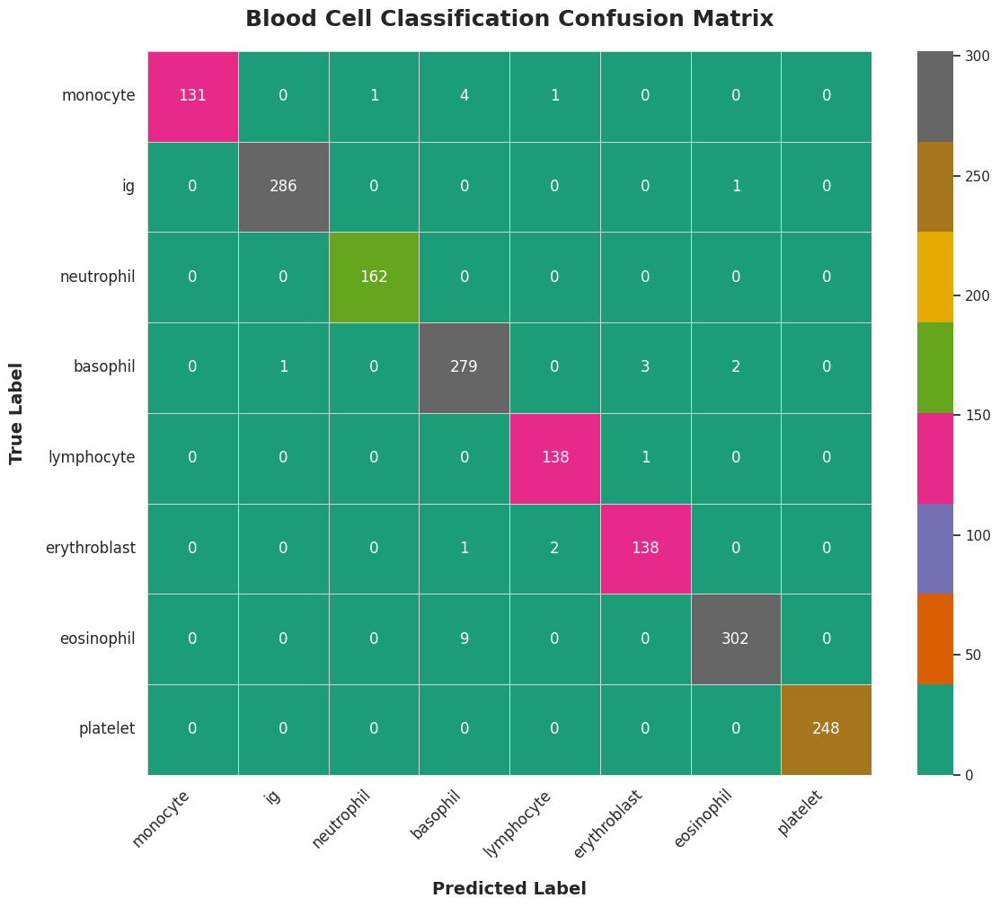

In [13]:
# ==========================================
# CONFUSION MATRIX GENERATION & PLOTTING
# ==========================================

# Calculate the raw confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Retrieve class names. (Using dynamic_class_names defined in our dataset cell. 
# If it's missing, we fallback to numeric labels).
try:
    labels = dynamic_class_names
except NameError:
    try:
        labels = class_names
    except NameError:
        labels = [f"Class {i}" for i in range(cm.shape[0])]

# Set up the figure aesthetic
plt.figure(figsize=(12, 10))
sns.set_theme(style="white") # Remove the background grid for heatmaps

# Plot the heatmap
ax = sns.heatmap(
    cm, 
    annot=True,          # Display the counts
    fmt='d',             # Format as integers
    cmap='Dark2',        # Professional color palette
    cbar=True,           # Show color scale bar
    square=True,         # Force square cells
    linewidths=0.5,      # Add a subtle grid
    linecolor='lightgray',
    xticklabels=labels, 
    yticklabels=labels,
    annot_kws={"size": 12} # Font size for the numbers inside cells
)

# Styling the axes and title
ax.set_title('Blood Cell Classification Confusion Matrix', fontsize=18, fontweight='bold', pad=20)
ax.set_xlabel('Predicted Label', fontsize=14, fontweight='bold', labelpad=15)
ax.set_ylabel('True Label', fontsize=14, fontweight='bold', labelpad=15)

# Adjust tick formatting for readability
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

# Ensure everything fits cleanly
plt.tight_layout()
plt.show()

In [14]:
# ==========================================
# DETAILED CLASSIFICATION REPORT
# ==========================================

# Retrieve class names safely (matching the logic from the confusion matrix cell)
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        # Fallback to numeric indices if class names are somehow lost in memory
        class_list = [f"Class {i}" for i in range(len(set(y_true)))]

# Generate the report text
report_text = classification_report(
    y_true, 
    y_pred, 
    target_names=class_list, 
    digits=4 # Forces 4 decimal places to match our previous tables
)

# Print with a clean, professional header
print("=" * 60)
print(f"{'PER-CLASS CLASSIFICATION REPORT':^60}")
print("=" * 60)
print(report_text)
print("=" * 60)

              PER-CLASS CLASSIFICATION REPORT               
              precision    recall  f1-score   support

    monocyte     1.0000    0.9562    0.9776       137
          ig     0.9965    0.9965    0.9965       287
  neutrophil     0.9939    1.0000    0.9969       162
    basophil     0.9522    0.9789    0.9654       285
  lymphocyte     0.9787    0.9928    0.9857       139
erythroblast     0.9718    0.9787    0.9753       141
  eosinophil     0.9902    0.9711    0.9805       311
    platelet     1.0000    1.0000    1.0000       248

    accuracy                         0.9848      1710
   macro avg     0.9854    0.9843    0.9847      1710
weighted avg     0.9850    0.9848    0.9848      1710



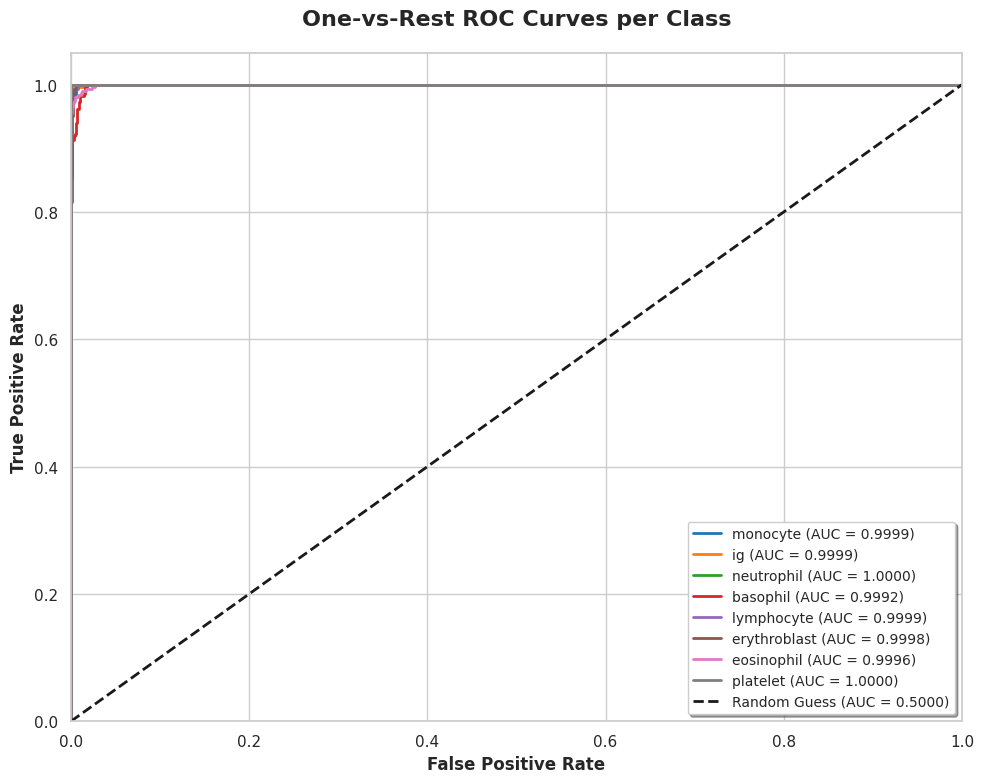

In [15]:
# ==========================================
# MULTI-CLASS ROC CURVE PLOTTING
# ==========================================

# Determine the number of classes from the probabilities array
n_classes = y_prob.shape[1]

# Binarize the true labels for One-vs-Rest ROC calculation
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(n_classes)]

# Set up the figure aesthetic
plt.figure(figsize=(10, 8))
sns.set_theme(style="whitegrid")

# Define a color palette with enough distinct colors for our classes
colors = sns.color_palette("tab10", n_colors=n_classes)

# Compute and plot ROC curve and ROC area for each class
for i, color in zip(range(n_classes), colors):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc = auc(fpr, tpr)
    
    plt.plot(
        fpr, 
        tpr, 
        color=color, 
        lw=2, 
        label=f"{class_list[i]} (AUC = {roc_auc:.4f})"
    )

# Plot the diagonal baseline (random guessing)
plt.plot([0, 1], [0, 1], 'k--', lw=2, label="Random Guess (AUC = 0.5000)")

# Styling the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=12, fontweight='bold')
plt.title('One-vs-Rest ROC Curves per Class', fontsize=16, fontweight='bold', pad=20)
plt.legend(loc="lower right", fontsize=10, frameon=True, shadow=True)

# Ensure everything fits cleanly
plt.tight_layout()
plt.show()

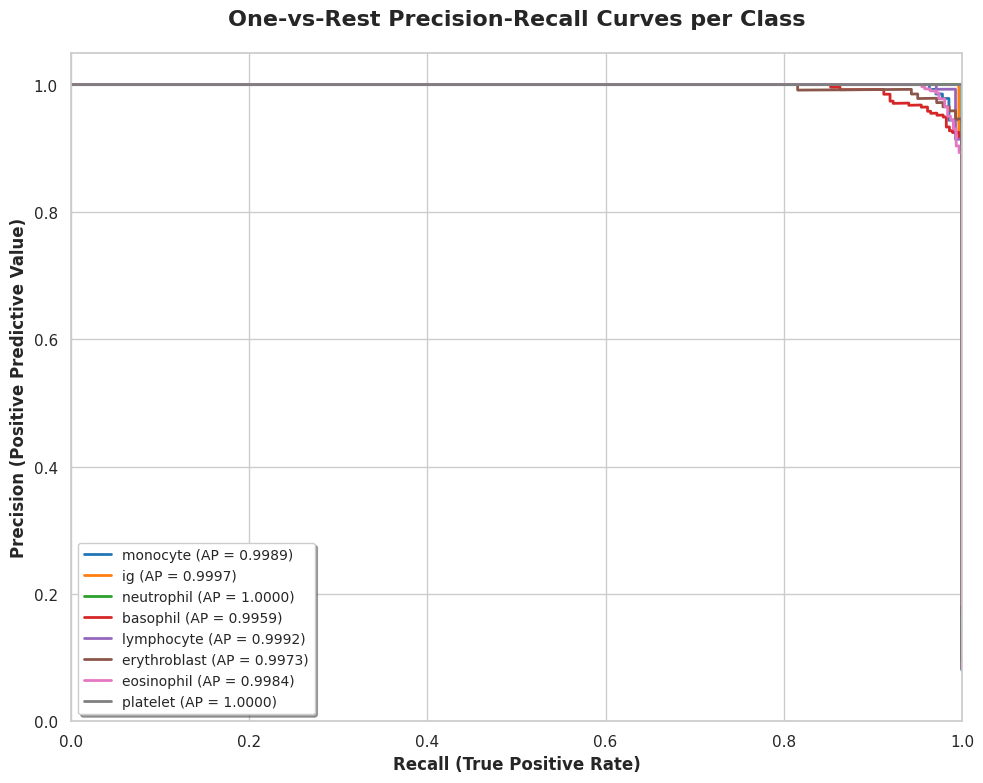

In [16]:
# ==========================================
# MULTI-CLASS PRECISION-RECALL CURVE
# ==========================================

# Determine the number of classes from the probabilities array
n_classes = y_prob.shape[1]

# Binarize the true labels for One-vs-Rest calculation
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(n_classes)]

# Set up the figure aesthetic
plt.figure(figsize=(10, 8))
sns.set_theme(style="whitegrid")

# Define a color palette
colors = sns.color_palette("tab10", n_colors=n_classes)

# Compute and plot PR curve and AP score for each class
for i, color in zip(range(n_classes), colors):
    precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_prob[:, i])
    average_precision = average_precision_score(y_true_bin[:, i], y_prob[:, i])
    
    plt.plot(
        recall, 
        precision, 
        color=color, 
        lw=2, 
        label=f"{class_list[i]} (AP = {average_precision:.4f})"
    )

# Styling the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall (True Positive Rate)', fontsize=12, fontweight='bold')
plt.ylabel('Precision (Positive Predictive Value)', fontsize=12, fontweight='bold')
plt.title('One-vs-Rest Precision-Recall Curves per Class', fontsize=16, fontweight='bold', pad=20)

# PR curves usually have their legend in the lower left or upper right to avoid overlapping lines
plt.legend(loc="best", fontsize=10, frameon=True, shadow=True)

# Ensure everything fits cleanly
plt.tight_layout()
plt.show()

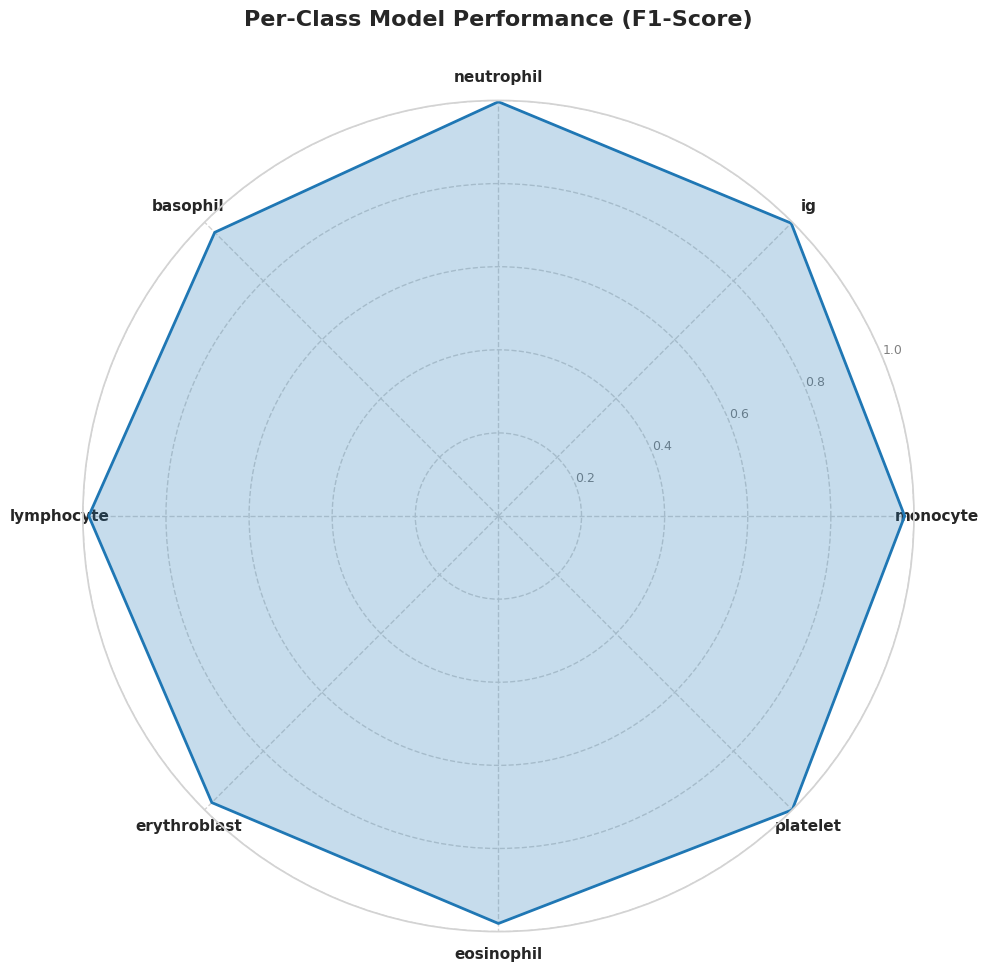

In [17]:
# ==========================================
# PER-CLASS F1-SCORE RADAR CHART
# ==========================================

# 1. Calculate per-class F1-scores
per_class_f1 = f1_score(y_true, y_pred, average=None)

# Retrieve class names safely
try:
    class_labels = dynamic_class_names
except NameError:
    try:
        class_labels = class_names
    except NameError:
        class_labels = [f"Class {i}" for i in range(len(per_class_f1))]

# 2. Prepare data for the radar chart
# We need to append the first value to the end of the lists to "close" the circular plot
values = np.concatenate((per_class_f1, [per_class_f1[0]]))
angles = np.linspace(0, 2 * np.pi, len(class_labels), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))

# 3. Set up the figure
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# 4. Plot the data
ax.plot(angles, values, color='#1f77b4', linewidth=2, linestyle='solid', label='F1-Score')
ax.fill(angles, values, color='#1f77b4', alpha=0.25)

# 5. Styling the axes and labels
# Set the labels around the perimeter
ax.set_xticks(angles[:-1])
ax.set_xticklabels(class_labels, fontsize=11, fontweight='bold')

# Configure the radial y-axis limits and labels
ax.set_ylim(0, 1.0)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(["0.2", "0.4", "0.6", "0.8", "1.0"], color="grey", size=9)

# Adjust the grid
ax.grid(color='#d3d3d3', linestyle='--', linewidth=1)
ax.spines['polar'].set_color('lightgrey')

# Title and layout
plt.title('Per-Class Model Performance (F1-Score)', size=16, fontweight='bold', y=1.08)
plt.tight_layout()
plt.show()

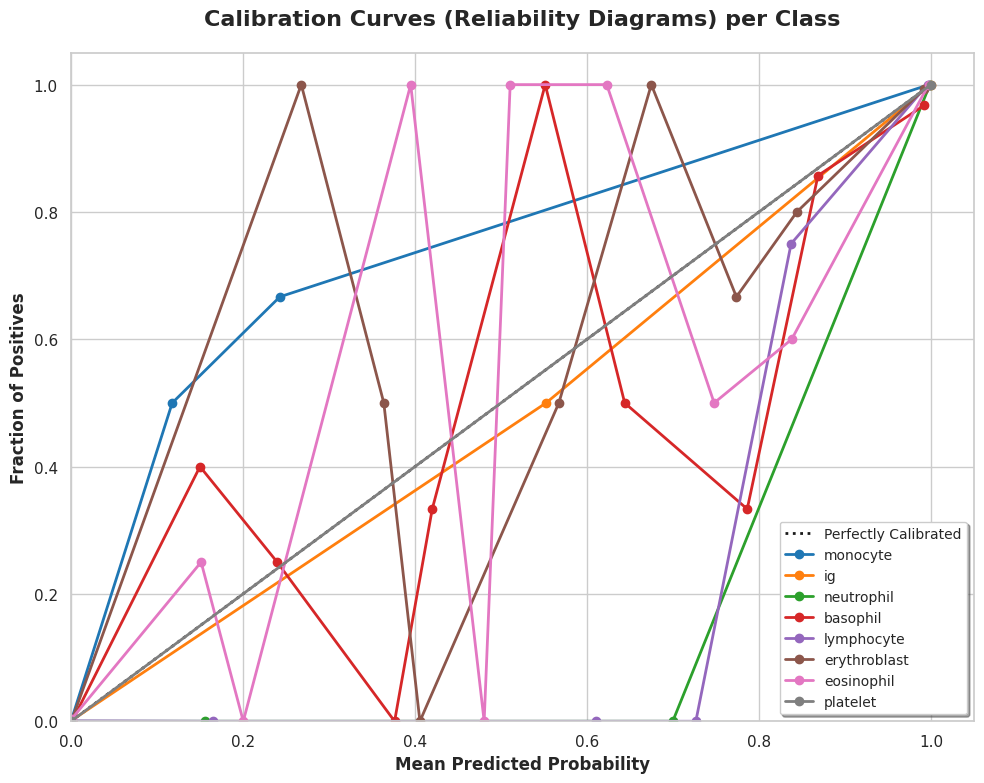

In [18]:
# ==========================================
# MULTI-CLASS CALIBRATION CURVE
# ==========================================

# Determine the number of classes from the probabilities array
n_classes = y_prob.shape[1]

# Binarize the true labels for One-vs-Rest calculation
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(n_classes)]

# Set up the figure aesthetic
plt.figure(figsize=(10, 8))
sns.set_theme(style="whitegrid")

# Plot the perfectly calibrated reference line (diagonal)
plt.plot([0, 1], [0, 1], "k:", linewidth=2, label="Perfectly Calibrated")

# Define a color palette
colors = sns.color_palette("tab10", n_colors=n_classes)

# Compute and plot calibration curve for each class
for i, color in zip(range(n_classes), colors):
    # n_bins divides the [0, 1] probability range into equal-width bins
    prob_true, prob_pred = calibration_curve(y_true_bin[:, i], y_prob[:, i], n_bins=10)
    
    plt.plot(
        prob_pred, 
        prob_true, 
        marker='o', 
        color=color, 
        linewidth=2, 
        label=class_list[i]
    )

# Styling the plot
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Mean Predicted Probability', fontsize=12, fontweight='bold')
plt.ylabel('Fraction of Positives', fontsize=12, fontweight='bold')
plt.title('Calibration Curves (Reliability Diagrams) per Class', fontsize=16, fontweight='bold', pad=20)
plt.legend(loc="lower right", fontsize=10, frameon=True, shadow=True)

# Ensure everything fits cleanly
plt.tight_layout()
plt.show()

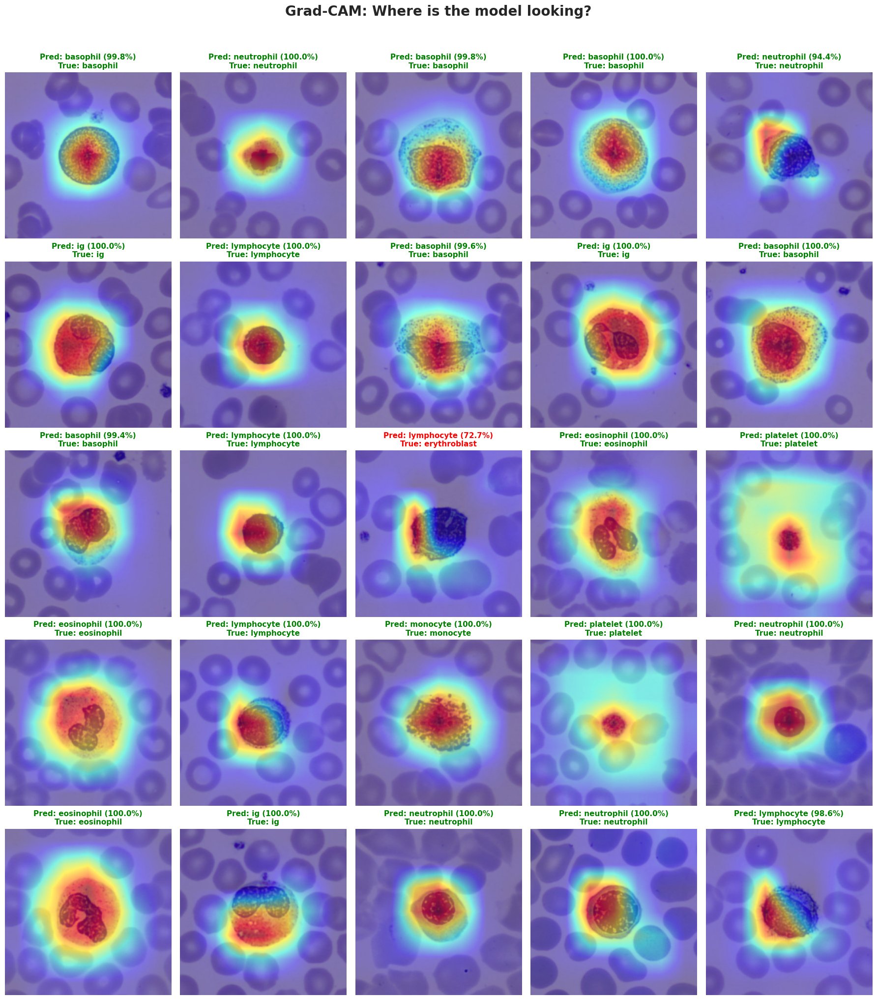

In [19]:
# ==========================================
# 1. SETUP & LAYER SELECTION
# ==========================================
# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

# Select the target layer for Grad-CAM
# If using the custom BloodCellCNN, it's model.features[-1]
# If using a standard ResNet18, it would be model.layer4[-1]
if hasattr(model, 'features'):
    target_layers = [model.features[-1]]
elif hasattr(model, 'layer4'):
    target_layers = [model.layer4[-1]]
else:
    raise ValueError("Could not automatically determine the target convolutional layer for Grad-CAM.")

# ==========================================
# 2. FETCH A BATCH OF 25 TEST IMAGES
# ==========================================
images_to_show = []
labels_to_show = []

# Shuffle test loader temporarily to get a random mix of 25 images
temp_loader = torch.utils.data.DataLoader(test_dataset, batch_size=25, shuffle=True)
images_tensor, true_labels = next(iter(temp_loader))
images_tensor = images_tensor.to(DEVICE)
true_labels = true_labels.to(DEVICE)

# ==========================================
# 3. GET PREDICTIONS & CONFIDENCE SCORES
# ==========================================
model.eval()
with torch.no_grad():
    logits = model(images_tensor)
    probs = F.softmax(logits, dim=1)
    confidences, preds = torch.max(probs, 1)

# ==========================================
# 4. GENERATE GRAD-CAM HEATMAPS
# ==========================================
# Initialize CAM object
cam = GradCAM(model=model, target_layers=target_layers)

# targets=None automatically targets the highest scoring class for each image
grayscale_cams = cam(input_tensor=images_tensor, targets=None)

# Helper function to reverse the Normalize() transform for displaying raw RGB images
def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(DEVICE)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(DEVICE)
    img = img_tensor * std + mean
    img = torch.clamp(img, 0, 1) # Ensure values are strictly between 0 and 1
    return img.cpu().numpy().transpose(1, 2, 0) # Convert to HxWxC for matplotlib

# ==========================================
# 5. PLOT THE 5x5 GRID
# ==========================================
fig, axes = plt.subplots(5, 5, figsize=(18, 20))
axes = axes.flatten()

for i in range(25):
    # 1. Get raw RGB image
    rgb_img = denormalize(images_tensor[i])
    
    # 2. Overlay heatmap on the RGB image
    cam_image = show_cam_on_image(rgb_img, grayscale_cams[i], use_rgb=True)
    
    # 3. Plot it
    axes[i].imshow(cam_image)
    axes[i].axis('off')
    
    # 4. Determine text formatting
    pred_class = class_list[preds[i].item()]
    true_class = class_list[true_labels[i].item()]
    conf = confidences[i].item() * 100
    
    # Check if correct
    is_correct = (preds[i] == true_labels[i])
    title_color = 'green' if is_correct else 'red'
    
    # 5. Apply Title
    title_text = f"Pred: {pred_class} ({conf:.1f}%)\nTrue: {true_class}"
    axes[i].set_title(title_text, color=title_color, fontsize=11, fontweight='bold')

plt.suptitle("Grad-CAM: Where is the model looking?", fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

Extracting latent space features from the test set...
Running t-SNE projection (this may take a moment)...


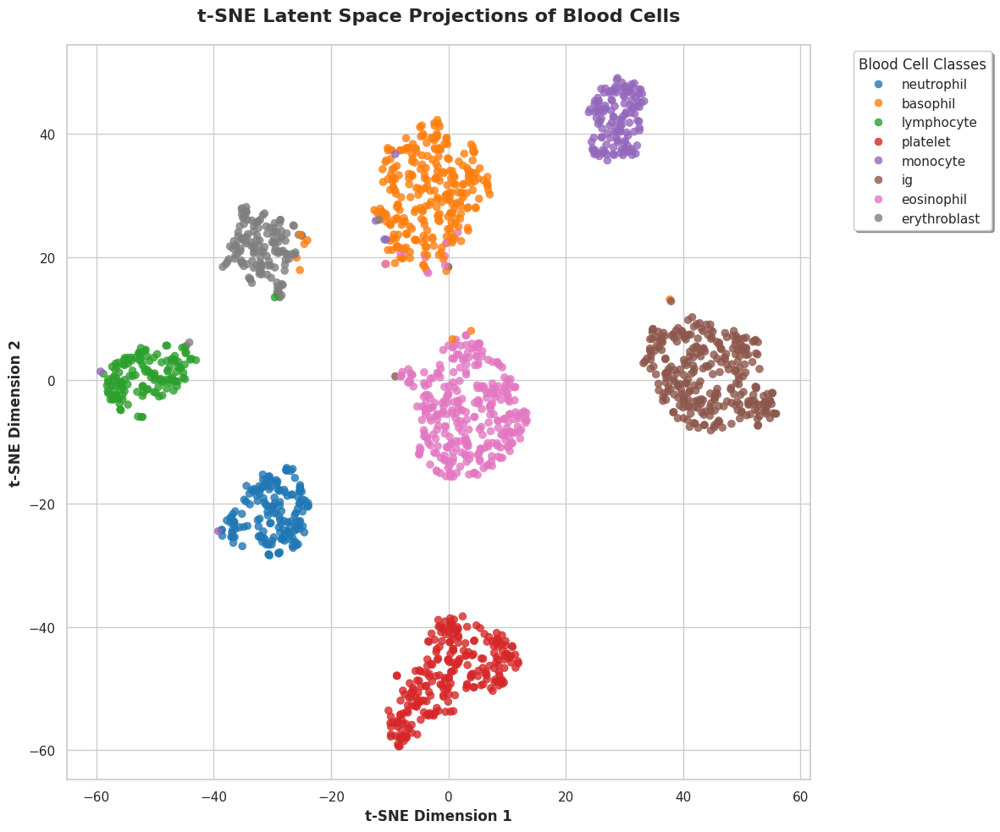

In [20]:
# ==========================================
# 1. EXTRACT EMBEDDINGS FROM THE TEST SET
# ==========================================
model.eval()
features_list = []
labels_list = []

print("Extracting latent space features from the test set...")

# Create a feature extractor model by slicing off the final classification layer
# (In your BloodCellCNN, the features and avgpool yield a 512-dim vector, 
# and the first linear layer in the classifier drops it to 128-dim)
feature_extractor = torch.nn.Sequential(
    model.features,
    model.avgpool,
    torch.nn.Flatten(),
    model.classifier[0], # Flatten
    model.classifier[1], # Dropout
    model.classifier[2], # Linear (512 -> 128)
    model.classifier[3]  # ReLU
).to(DEVICE)
feature_extractor.eval()

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        # Pass images through the feature extractor
        feats = feature_extractor(images)
        
        features_list.append(feats.cpu().numpy())
        labels_list.append(labels.numpy())

# Concatenate all batches into single numpy arrays
X_features = np.concatenate(features_list, axis=0)
y_labels = np.concatenate(labels_list, axis=0)

# ==========================================
# 2. RUN t-SNE DIMENSIONALITY REDUCTION
# ==========================================
print("Running t-SNE projection (this may take a moment)...")
tsne = TSNE(
    n_components=2, 
    perplexity=30, 
    max_iter=1000, 
    random_state=42, 
    n_jobs=-1
)
X_embedded = tsne.fit_transform(X_features)

# ==========================================
# 3. PLOT THE t-SNE SCATTER PLOT
# ==========================================
# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(len(np.unique(y_labels)))]

plt.figure(figsize=(12, 10))
sns.set_theme(style="whitegrid")

# Create a scatter plot colored by true classes
scatter = sns.scatterplot(
    x=X_embedded[:, 0],
    y=X_embedded[:, 1],
    hue=[class_list[label] for label in y_labels],
    palette="tab10",
    alpha=0.8,
    s=40,
    edgecolor=None
)

# Styling the plot
plt.title('t-SNE Latent Space Projections of Blood Cells', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('t-SNE Dimension 1', fontsize=12, fontweight='bold')
plt.ylabel('t-SNE Dimension 2', fontsize=12, fontweight='bold')

# Format legend cleanly
plt.legend(
    title='Blood Cell Classes', 
    bbox_to_anchor=(1.05, 1), 
    loc='upper left', 
    fontsize=11, 
    title_fontsize=12,
    frameon=True, 
    shadow=True
)

plt.tight_layout()
plt.show()

Scanning test set for model errors...


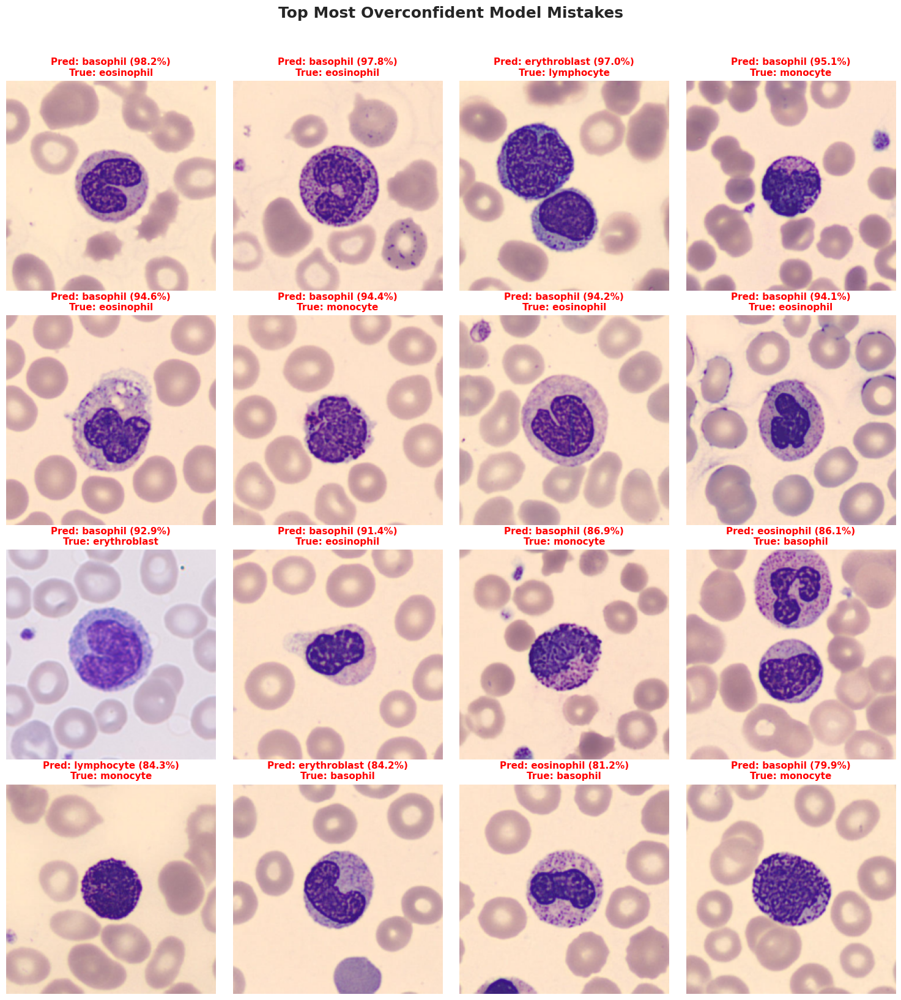

In [21]:
# ==========================================
# 1. FIND HIGHEST CONFIDENCE ERRORS
# ==========================================
model.eval()

all_images = []
all_true = []
all_pred = []
all_conf = []

print("Scanning test set for model errors...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        
        logits = model(images)
        probs = F.softmax(logits, dim=1)
        confidences, preds = torch.max(probs, dim=1)
        
        # Move data to CPU for storage
        for i in range(images.size(0)):
            if preds[i].item() != labels[i].item():  # If it's a mistake
                all_images.append(images[i].cpu())
                all_true.append(labels[i].item())
                all_pred.append(preds[i].item())
                all_conf.append(confidences[i].item())

# Check if any errors were found
if len(all_images) == 0:
    print("Amazing! The model made zero mistakes on the test set.")
else:
    # Sort errors by confidence in descending order (highest confidence mistakes first)
    sorted_indices = np.argsort(all_conf)[::-1]
    
    # Select up to the top 16 highest confidence mistakes (or fewer if total errors < 16)
    k = min(16, len(sorted_indices))
    
    # Retrieve class names safely
    try:
        class_list = dynamic_class_names
    except NameError:
        try:
            class_list = class_names
        except NameError:
            class_list = [f"Class {i}" for i in range(8)]

    # Helper function to denormalize images for plotting
    def denormalize(img_tensor):
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img = img_tensor * std + mean
        img = torch.clamp(img, 0, 1)
        return img.numpy().transpose(1, 2, 0)

    # ==========================================
    # 2. PLOT THE GRID OF WORST MISTAKES
    # ==========================================
    # Calculate dynamic grid dimensions (up to 4x4)
    ncols = 4
    nrows = (k + ncols - 1) // ncols
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4 * nrows))
    axes = np.array(axes).flatten()

    for i in range(k):
        idx = sorted_indices[i]
        img = denormalize(all_images[idx])
        
        true_name = class_list[all_true[idx]]
        pred_name = class_list[all_pred[idx]]
        conf = all_conf[idx] * 100
        
        axes[i].imshow(img)
        axes[i].axis('off')
        
        # Red title to highlight overconfident error
        title_str = f"Pred: {pred_name} ({conf:.1f}%)\nTrue: {true_name}"
        axes[i].set_title(title_str, color='red', fontsize=11, fontweight='bold')

    # Turn off any unused subplots if fewer than 16 errors exist
    for j in range(k, len(axes)):
        axes[j].axis('off')

    plt.suptitle("Top Most Overconfident Model Mistakes", fontsize=18, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

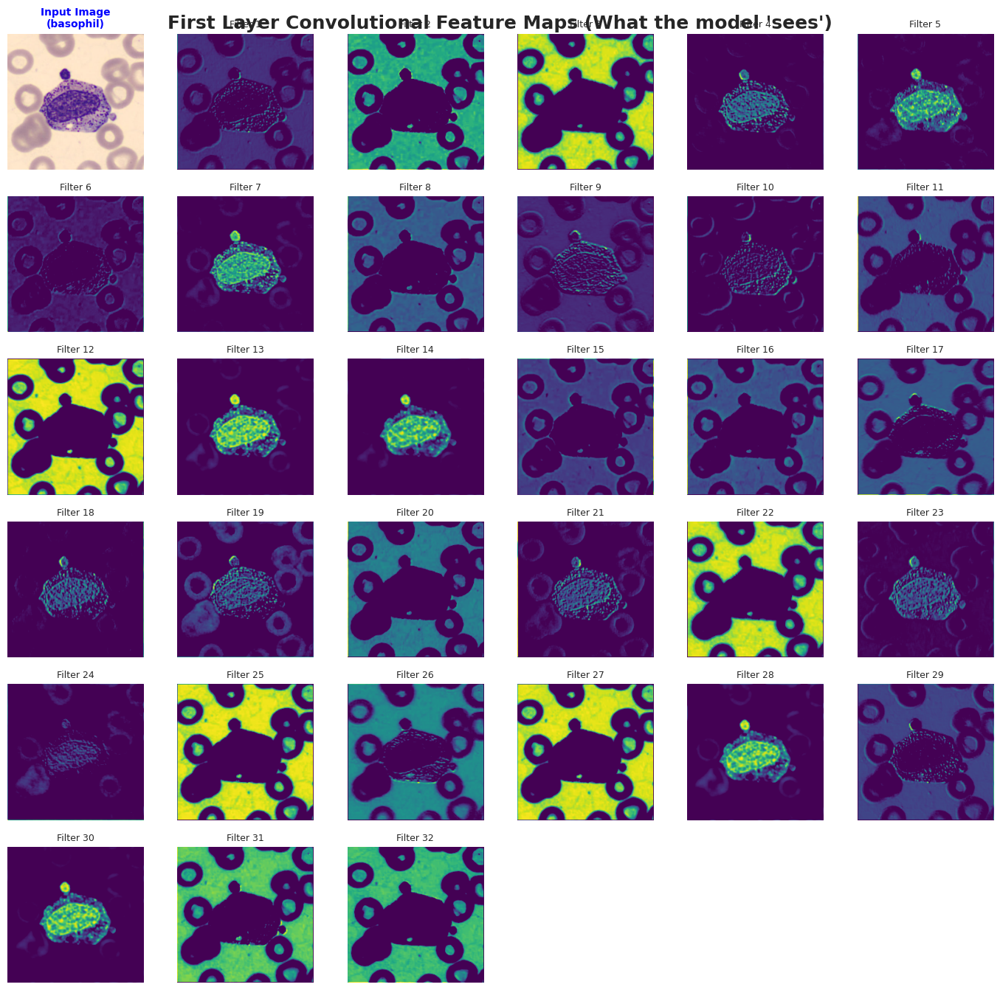

In [22]:
# ==========================================
# 1. GRAB A SINGLE IMAGE FROM THE TEST SET
# ==========================================
model.eval()
temp_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=True)
single_image, true_label = next(iter(temp_loader))
single_image = single_image.to(DEVICE)

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

true_class_name = class_list[true_label.item()]

# ==========================================
# 2. EXTRACT FEATURE MAPS FROM THE FIRST CONV LAYER
# ==========================================
# In your BloodCellCNN, the first layer is inside features[0] (the first conv block)
# Specifically, the Conv2d layer is features[0][0]
try:
    first_conv_layer = model.features[0][0]
except (AttributeError, IndexError):
    raise ValueError("Could not automatically locate the first convolutional layer. Check model architecture.")

# Hook or forward pass directly through the first conv block
with torch.no_grad():
    # Pass image through the first sequential block up to the ReLU/MaxPool to see raw activations
    # model.features[0] contains: [Conv2d, BatchNorm2d, ReLU, MaxPool2d]
    # Let's pass it through the Conv2d and ReLU to see clear feature maps
    x = single_image
    x = model.features[0][0](x) # Conv2d
    x = model.features[0][1](x) # BatchNorm2d
    activation_maps = model.features[0][2](x) # ReLU

# Move activations to CPU and detach
activation_maps = activation_maps.squeeze(0).cpu().numpy() # Shape: (32, H, W)
num_filters = activation_maps.shape[0]

# Helper function to denormalize the original input image for display
def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(DEVICE)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(DEVICE)
    img = img_tensor * std + mean
    img = torch.clamp(img, 0, 1)
    return img.cpu().squeeze(0).numpy().transpose(1, 2, 0)

original_img = denormalize(single_image)

# ==========================================
# 3. PLOT THE ORIGINAL IMAGE & FEATURE MAPS
# ==========================================
# We have 32 filters. Let's make a grid (e.g., 6 columns x 6 rows, including the original image)
fig = plt.figure(figsize=(14, 14))

# Plot the original source image first in position (1)
ax = plt.subplot(6, 6, 1)
ax.imshow(original_img)
ax.set_title(f"Input Image\n({true_class_name})", fontsize=10, fontweight='bold', color='blue')
ax.axis('off')

# Plot all 32 individual filter activation maps
for i in range(num_filters):
    ax = plt.subplot(6, 6, i + 2)
    # Plot each filter's 2D activation grid using a vibrant colormap (e.g., 'viridis' or 'plasma')
    ax.imshow(activation_maps[i], cmap='viridis')
    ax.set_title(f"Filter {i+1}", fontsize=9)
    ax.axis('off')

plt.suptitle("First Layer Convolutional Feature Maps (What the model 'sees')", fontsize=18, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()

Computing Integrated Gradients for 15 test images (please wait a moment)...


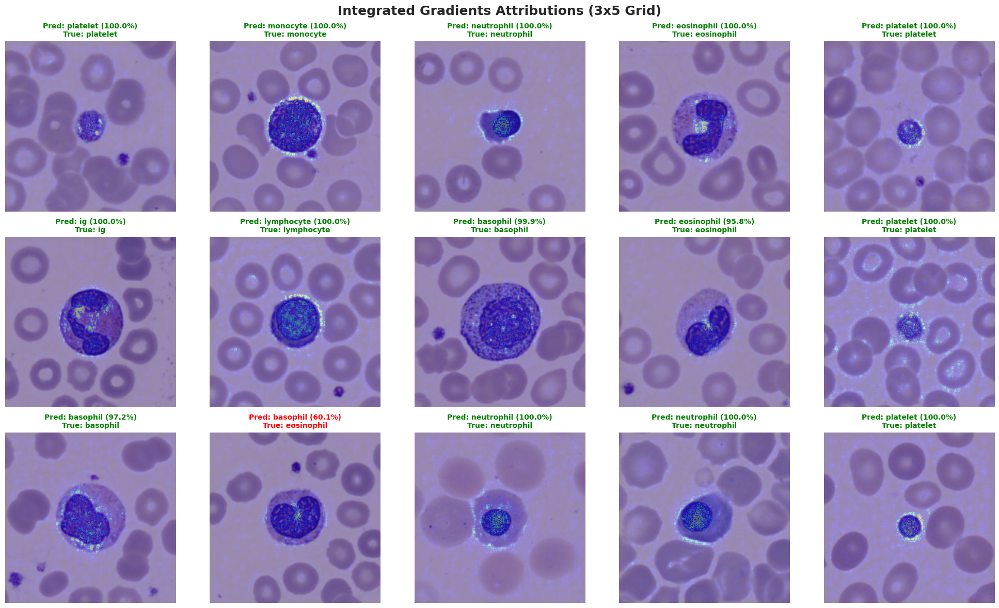

In [23]:
# ==========================================
# 1. SETUP INTEGRATED GRADIENTS
# ==========================================
model.eval()
ig = IntegratedGradients(model)

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

# Helper function to denormalize images for visualization
def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(DEVICE)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(DEVICE)
    img = img_tensor * std + mean
    return torch.clamp(img, 0, 1).cpu().squeeze(0).permute(1, 2, 0).numpy()

# ==========================================
# 2. FETCH A BATCH OF 15 TEST IMAGES
# ==========================================
temp_loader = torch.utils.data.DataLoader(test_dataset, batch_size=15, shuffle=True)
images_tensor, true_labels = next(iter(temp_loader))
images_tensor = images_tensor.to(DEVICE)
true_labels = true_labels.to(DEVICE)

print("Computing Integrated Gradients for 15 test images (please wait a moment)...")

# ==========================================
# 3. SET UP THE 3x5 PLOTTING GRID
# ==========================================
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

for i in range(15):
    single_img = images_tensor[i].unsqueeze(0) # Keep batch dimension for Captum (1, C, H, W)
    true_lbl = true_labels[i].item()
    
    # Forward pass to get prediction
    with torch.no_grad():
        logits = model(single_img)
        probs = F.softmax(logits, dim=1)
        conf, pred_lbl = torch.max(probs, dim=1)
        pred_lbl = pred_lbl.item()
        conf = conf.item() * 100

    # Compute attributions for this specific image
    attributions = ig.attribute(
        single_img, 
        target=pred_lbl, 
        baselines=torch.zeros_like(single_img), 
        n_steps=30 # Lowered slightly to 30 for faster batch processing on 15 images
    )
    
    # Convert original image and attributions to numpy
    orig_np = denormalize(single_img)
    attr_np = attributions.cpu().squeeze(0).permute(1, 2, 0).numpy()
    
    # Average attribution across color channels for a clean 2D heatmap overlay
    attr_heatmap = np.mean(np.abs(attr_np), axis=2)
    # Normalize heatmap between 0 and 1 for display
    if attr_heatmap.max() > 0:
        attr_heatmap /= attr_heatmap.max()

    # Plot original image blended with the heatmap manually for grid layout compatibility
    axes[i].imshow(orig_np)
    axes[i].imshow(attr_heatmap, cmap='jet', alpha=0.4) # Overlay heatmap
    axes[i].axis('off')
    
    # Color-code title: Green if correct, Red if wrong
    is_correct = (pred_lbl == true_lbl)
    title_color = 'green' if is_correct else 'red'
    
    pred_name = class_list[pred_lbl]
    true_name = class_list[true_lbl]
    
    axes[i].set_title(
        f"Pred: {pred_name} ({conf:.1f}%)\nTrue: {true_name}", 
        color=title_color, 
        fontsize=10, 
        fontweight='bold'
    )

plt.suptitle("Integrated Gradients Attributions (3x5 Grid)", fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

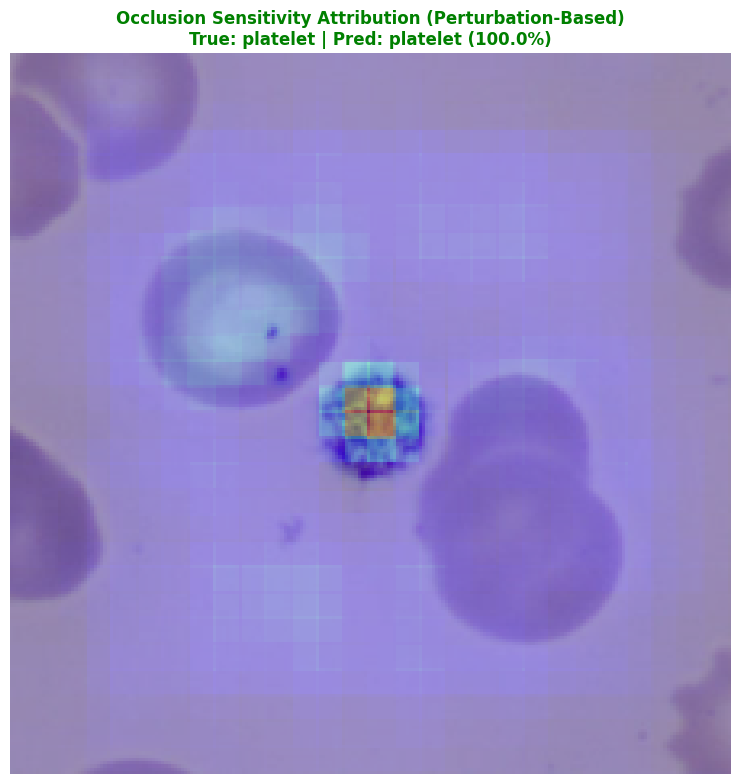

In [24]:
# ==========================================
# 1. SETUP OCCLUSION SENSITIVITY
# ==========================================
model.eval()

# Initialize Occlusion with a patch size (e.g., 15x15 pixels) and stride
occlusion = Occlusion(model)

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

# ==========================================
# 2. SELECT A SINGLE IMAGE FROM TEST SET
# ==========================================
temp_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=True)
single_image, true_label = next(iter(temp_loader))
single_image = single_image.to(DEVICE)
true_label = true_label.to(DEVICE)

# Forward pass to get model's prediction
with torch.no_grad():
    logits = model(single_image)
    probs = F.softmax(logits, dim=1)
    conf, pred_label = torch.max(probs, dim=1)

# ==========================================
# 3. COMPUTE OCCLUSION ATTRIBUTIONS
# ==========================================
# sliding_window_shapes: size of the occluding window (channels, height, width)
# strides: how many pixels the window moves per step
attributions = occlusion.attribute(
    single_image, 
    target=pred_label.item(),
    sliding_window_shapes=(3, 15, 15),
    strides=(3, 8, 8)
)

# ==========================================
# 4. PREPARE & PLOT THE RESULTS
# ==========================================
def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(DEVICE)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(DEVICE)
    img = img_tensor * std + mean
    return torch.clamp(img, 0, 1).cpu().squeeze(0).permute(1, 2, 0).numpy()

orig_np = denormalize(single_image)
attr_np = attributions.cpu().squeeze(0).permute(1, 2, 0).numpy()

# Average across color channels to get a clean 2D heatmap
heatmap = np.mean(np.abs(attr_np), axis=2)
if heatmap.max() > 0:
    heatmap /= heatmap.max()

# Plotting
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(orig_np)
ax.imshow(heatmap, cmap='jet', alpha=0.4) # Overlay heatmap
ax.axis('off')

is_correct = (pred_label.item() == true_label.item())
title_color = 'green' if is_correct else 'red'

ax.set_title(
    f"Occlusion Sensitivity Attribution (Perturbation-Based)\n"
    f"True: {class_list[true_label.item()]} | "
    f"Pred: {class_list[pred_label.item()]} ({conf.item()*100:.1f}%)",
    color=title_color,
    fontsize=12,
    fontweight='bold'
)

plt.tight_layout()
plt.show()

Analyzing test set prediction confidences...


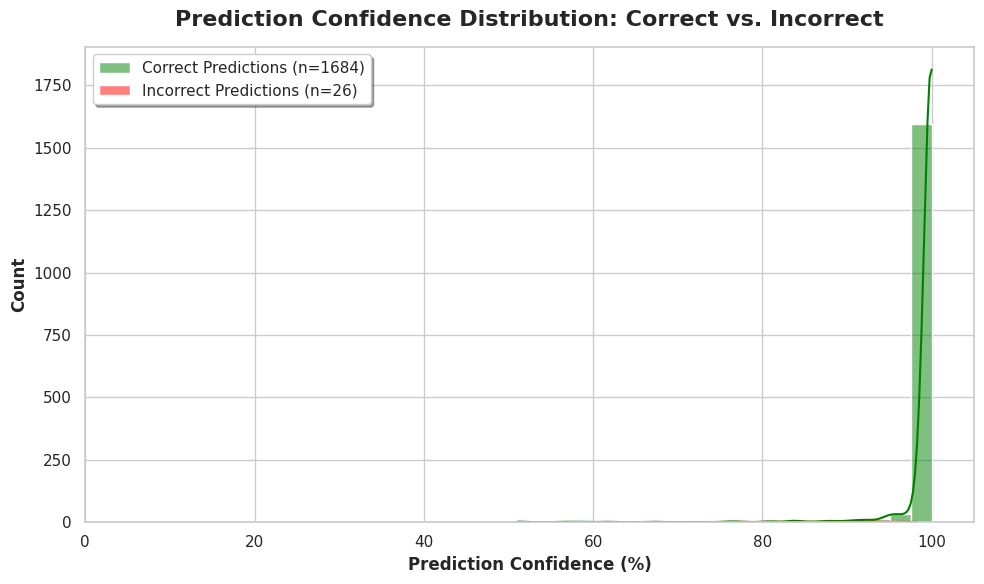

In [25]:
# ==========================================
# 1. COLLECT CONFIDENCE SCORES & CORRECTNESS
# ==========================================
model.eval()
correct_confidences = []
incorrect_confidences = []

print("Analyzing test set prediction confidences...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        
        logits = model(images)
        probs = F.softmax(logits, dim=1)
        confidences, preds = torch.max(probs, dim=1)
        
        # Separate confidences based on whether the prediction was right or wrong
        for i in range(images.size(0)):
            conf = confidences[i].item() * 100 # Convert to percentage
            if preds[i].item() == labels[i].item():
                correct_confidences.append(conf)
            else:
                incorrect_confidences.append(conf)

# ==========================================
# 2. PLOT THE CONFIDENCE HISTOGRAMS
# ==========================================
plt.figure(figsize=(10, 6))
sns.set_theme(style="whitegrid")

# Plot correct predictions distribution
sns.histplot(
    correct_confidences, 
    bins=20, 
    color='green', 
    label=f'Correct Predictions (n={len(correct_confidences)})', 
    kde=True, 
    alpha=0.5
)

# Plot incorrect predictions distribution
sns.histplot(
    incorrect_confidences, 
    bins=20, 
    color='red', 
    label=f'Incorrect Predictions (n={len(incorrect_confidences)})', 
    kde=True, 
    alpha=0.5
)

# Styling the plot
plt.title('Prediction Confidence Distribution: Correct vs. Incorrect', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Prediction Confidence (%)', fontsize=12, fontweight='bold')
plt.ylabel('Count', fontsize=12, fontweight='bold')
plt.xlim([0, 105])
plt.legend(loc='upper left', fontsize=11, frameon=True, shadow=True)

plt.tight_layout()
plt.show()

Computing Occlusion Sensitivity heatmaps for 15 test images...


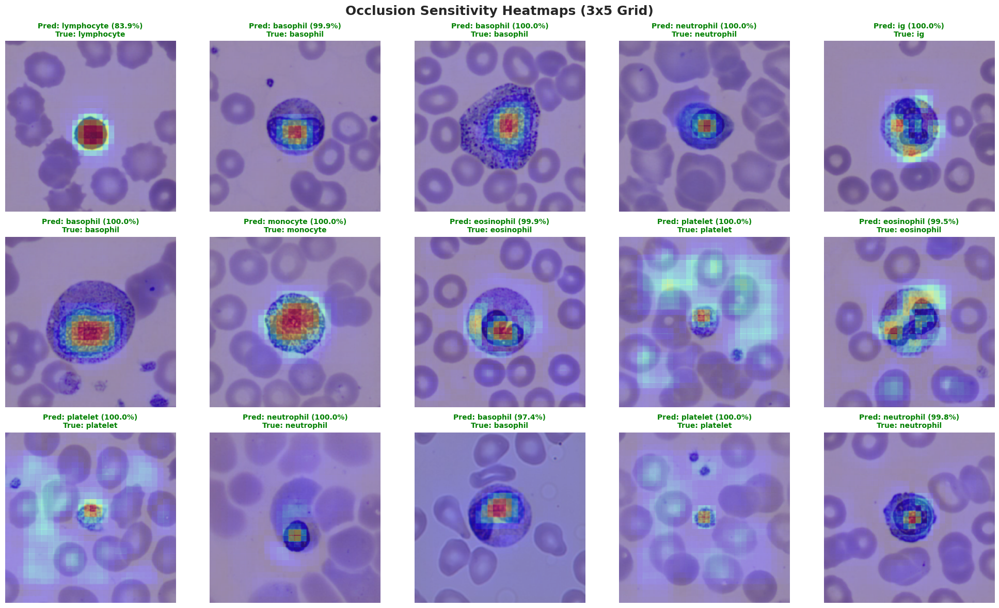

In [26]:
# ==========================================
# 1. SETUP OCCLUSION SENSITIVITY
# ==========================================
model.eval()
occlusion = Occlusion(model)

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

# Helper function to denormalize images for visualization
def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(DEVICE)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(DEVICE)
    img = img_tensor * std + mean
    return torch.clamp(img, 0, 1).cpu().squeeze(0).permute(1, 2, 0).numpy()

# ==========================================
# 2. FETCH A BATCH OF 15 TEST IMAGES
# ==========================================
temp_loader = torch.utils.data.DataLoader(test_dataset, batch_size=15, shuffle=True)
images_tensor, true_labels = next(iter(temp_loader))
images_tensor = images_tensor.to(DEVICE)
true_labels = true_labels.to(DEVICE)

print("Computing Occlusion Sensitivity heatmaps for 15 test images...")

# ==========================================
# 3. SET UP THE 3x5 PLOTTING GRID
# ==========================================
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

for i in range(15):
    single_img = images_tensor[i].unsqueeze(0) # Keep batch dimension (1, C, H, W)
    true_lbl = true_labels[i].item()
    
    # Forward pass to get prediction
    with torch.no_grad():
        logits = model(single_img)
        probs = F.softmax(logits, dim=1)
        conf, pred_lbl = torch.max(probs, dim=1)
        pred_lbl = pred_lbl.item()
        conf = conf.item() * 100

    # Compute occlusion attributions
    # sliding_window_shapes: patch size (channels, height, width)
    # strides: movement step size
    attributions = occlusion.attribute(
        single_img, 
        target=pred_lbl,
        sliding_window_shapes=(3, 15, 15),
        strides=(3, 8, 8)
    )
    
    # Convert original image and attributions to numpy
    orig_np = denormalize(single_img)
    attr_np = attributions.cpu().squeeze(0).permute(1, 2, 0).numpy()
    
    # Average attribution across color channels to get a clean 2D heatmap
    heatmap = np.mean(np.abs(attr_np), axis=2)
    if heatmap.max() > 0:
        heatmap /= heatmap.max()

    # Plot original image blended with the heatmap
    axes[i].imshow(orig_np)
    axes[i].imshow(heatmap, cmap='jet', alpha=0.4) # Overlay heatmap
    axes[i].axis('off')
    
    # Color-code title: Green if correct, Red if wrong
    is_correct = (pred_lbl == true_lbl)
    title_color = 'green' if is_correct else 'red'
    
    pred_name = class_list[pred_lbl]
    true_name = class_list[true_lbl]
    
    axes[i].set_title(
        f"Pred: {pred_name} ({conf:.1f}%)\nTrue: {true_name}", 
        color=title_color, 
        fontsize=10, 
        fontweight='bold'
    )

plt.suptitle("Occlusion Sensitivity Heatmaps (3x5 Grid)", fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

In [27]:
# ==========================================
# 1. SETUP MODEL & TRANSFORMATIONS
# ==========================================
model.eval()

# Retrieve class names safely
try:
    class_list = dynamic_class_names
except NameError:
    try:
        class_list = class_names
    except NameError:
        class_list = [f"Class {i}" for i in range(8)]

# Define the standard evaluation transform matching your pipeline
inference_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 2. DEFINE PREDICTION FUNCTION FOR GRADIO
# ==========================================
def predict_blood_cell(image):
    if image is None:
        return "Please upload or select an image first."
    
    # Convert PIL Image to tensor and send to device
    img_tensor = inference_transform(image).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        logits = model(img_tensor)
        probs = F.softmax(logits, dim=1)[0]
        
    # Format probabilities into a dictionary for Gradio's Label component
    confidences = {class_list[i]: float(probs[i].item()) for i in range(len(class_list))}
    
    return confidences

# ==========================================
# 3. BUILD & LAUNCH THE GRADIO INTERFACE
# ==========================================
demo = gr.Interface(
    fn=predict_blood_cell,
    inputs=gr.Image(type="pil", label="Upload Blood Cell Microscope Image"),
    outputs=gr.Label(num_top_classes=3, label="Model Predictions & Confidences"),
    title="🔬 Automated Blood Cell Classifier",
    description="Upload a microscopic image of a blood cell to classify its type using your trained deep learning model.",
    theme=gr.themes.Soft(primary_hue="blue", secondary_hue="indigo"),
    flagging_mode="never" # Updated from allow_flagging to remove the deprecation warning
)

# Setting share=True gives you a secure public link that bypasses notebook iframe loading blocks
demo.launch(inline=False, share=True, debug=False)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://c444b5f24e5b95321c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
